# Using LIME for activity recognition models
In this tutorial we will show you how to use the LIME framework on video activity recognition models trained on Kinetics-400.

In [1]:
%load_ext autoreload

import torch
import json

import numpy as np
import matplotlib.pyplot as plt

from pytorchvideo.data.encoded_video import EncodedVideo
from torchvision.transforms._transforms_video import NormalizeVideo, CenterCropVideo
from torchvision.transforms import Lambda
from torchvision.transforms.v2 import Compose
from pytorchvideo.transforms import UniformTemporalSubsample, ShortSideScale
from lime import lime_video
from matplotlib import animation

/Users/youritomassen/Projects/lime/.venv/lib/python3.12/site-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/Users/youritomassen/Projects/lime/.venv/lib/python3.12/site-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(
/Users/youritomassen/Projects/lime/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device('cpu')
model_name = 'slowfast_r50'
model = torch.hub.load('facebookresearch/pytorchvideo', model=model_name, pretrained=True)

# Set to eval mode and move to desired device
model = model.to(device)
model = model.eval()

Using cache found in /Users/youritomassen/.cache/torch/hub/facebookresearch_pytorchvideo_main


In [3]:
with open('./data/kinetics_classnames.json', 'r') as f:
    kinetics_classnames = json.load(f)

# Create an id to label name mapping
kinetics_id_to_classname = {}
for k, v in kinetics_classnames.items():
    kinetics_id_to_classname[v] = str(k).replace('"', "")

In [4]:
side_size = 256
mean = [0.45, 0.45, 0.45]
std = [0.225, 0.225, 0.225]
crop_size = 256
num_frames = 32
sampling_rate = 2
frames_per_second = 30
alpha = 4

transform = Compose([
    UniformTemporalSubsample(num_frames),
    Lambda(lambda x: x / 255.0),
    NormalizeVideo(mean, std),
    ShortSideScale(
        size=side_size
    ),
    CenterCropVideo(crop_size),
])

# The duration of the input clip is also specific to the model.
clip_duration = (num_frames * sampling_rate) / frames_per_second

In [5]:
video = EncodedVideo.from_path('./data/archery.mp4')
start_sec = 0
end_sec = start_sec + clip_duration
video_data = video.get_clip(start_sec=start_sec, end_sec=end_sec)

In [6]:
# Apply a transform to normalize the video input
xb = transform(video_data['video']).unsqueeze(0)

xb_fast = xb[:]
xb_slow = xb[:, :, ::alpha]
input = [xb_slow, xb_fast]
out = model(input)

In [7]:
post_act = torch.nn.Softmax(dim=1)
preds = post_act(out)
pred_classes = preds.topk(k=5).indices

# Map the predicted classes to the label names
pred_class_names = [kinetics_id_to_classname[int(i)] for i in pred_classes[0]]
print("Predicted labels: %s" % ", ".join(pred_class_names))

Predicted labels: archery, throwing axe, playing paintball, disc golfing, riding or walking with horse


In [8]:
def batch_predict(videos):
    """
    Args:
        videos: 5d numpy array with shape [B, T, H, W, C]

    Returns:
        probs: 2d numpy array with shape [B, num_classes]
    """
    if type(videos) == np.ndarray:
        videos = torch.from_numpy(videos)

    if len(videos.shape) == 4:
        videos = videos.unsqueeze(0)

    model.eval()
    videos = videos.permute(0, 4, 1, 2, 3)
    xb = torch.stack([transform(i) for i in videos])

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    xb = xb.to(device)

    xb_fast = xb[:]
    xb_slow = xb[:, :, ::alpha]
    input = [xb_slow, xb_fast]

    logits = model(input)
    probs = post_act(logits)
    return probs.detach().cpu().numpy()

In [9]:
# test batch_predict
video = EncodedVideo.from_path('./data/archery.mp4')
start_sec = 0
end_sec = start_sec + clip_duration
video_data = video.get_clip(start_sec=start_sec, end_sec=end_sec)
x = video_data['video'].clone().permute(1, 2, 3, 0).unsqueeze(0).numpy()
probs = batch_predict(x)

In [10]:
explainer = lime_video.LimeVideoExplainer()
explainer_input = video_data['video']
explainer_input = transform(explainer_input).permute(1, 2, 3, 0).numpy()

explanation = explainer.explain_instance(explainer_input,
                                         batch_predict,
                                         top_labels=5,
                                         hide_color=0,
                                         num_samples=100,
                                         num_features=10_000)

100%|██████████| 100/100 [01:41<00:00,  1.01s/it]


In [11]:
def denormalize(frames, mean, std, dtype=np.float32):
    if type(mean) != np.ndarray:
        mean = np.array(mean)

    if type(std) != np.ndarray:
        std = np.array(std)

    frames = frames * np.array(std)[None, None, None, :] + np.array(mean)[None, None, None, :]
    if dtype == np.float32:
        return np.clip(frames, 0.0, 1.0, dtype=np.float32)

    return np.uint8(frames)

Show a single frame of the positive features.

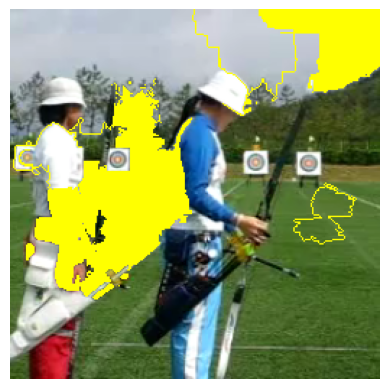

In [20]:
from skimage.segmentation import mark_boundaries

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)

temp = denormalize(temp, mean, std)
img_boundry1 = mark_boundaries(temp, mask)
plt.imshow(img_boundry1[2])
plt.axis('off')
plt.show()

Also show the negative features and increase the number of features; omit the boundaries for more clarity.

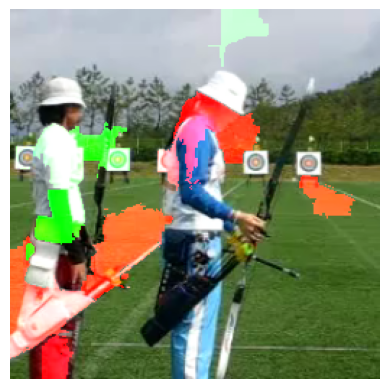

In [23]:
temp, _ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
temp = denormalize(temp, mean, std)

plt.imshow(temp[0])
plt.axis('off')
plt.show()

Create an animated video showing all the frames.

In [28]:
import matplotlib.animation as animation
from IPython.display import HTML

def vidshow(video, interval, axis='on'):
    fig = plt.figure()
    plt.ioff()  # Turn off interactive mode
    ax = fig.add_subplot(111)

    img = ax.imshow(video[0])
    ax.axis(axis)
    def _update(frame):
        img.set_data(video[frame])

    ani = animation.FuncAnimation(fig, _update, frames=len(temp), interval=interval)
    plt.close(fig)  # Close the figure to prevent display

    return HTML(ani.to_jshtml()), ani

html, ani = vidshow(temp, interval=240, axis='off')
html

Save the animation as a gif

In [15]:
ani.save(filename="./data/archery.gif", writer="pillow")